Initializes libraries (pandas, numpy, matplotlib, and seaborn)


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn import metrics
plt.style.use('ggplot')
pd.set_option('display.max_columns', 200)
from scipy import stats

Loads data from a GitHub URL.

In [2]:
url='https://raw.githubusercontent.com/nahdes/TenxWeek0/refs/heads/main/notebooks/togo-dapaong_qc.csv'
data_frame = pd.read_csv(url)

Displaying  the shape of the dataset

In [3]:
data_frame.shape


(525600, 19)

Displays the first few rows of the dataset.



In [4]:
data_frame.head


<bound method NDFrame.head of                Timestamp  GHI  DNI  DHI  ModA  ModB  Tamb    RH   WS  WSgust  \
0       2021-10-25 00:01 -1.3  0.0  0.0   0.0   0.0  24.8  94.5  0.9     1.1   
1       2021-10-25 00:02 -1.3  0.0  0.0   0.0   0.0  24.8  94.4  1.1     1.6   
2       2021-10-25 00:03 -1.3  0.0  0.0   0.0   0.0  24.8  94.4  1.2     1.4   
3       2021-10-25 00:04 -1.2  0.0  0.0   0.0   0.0  24.8  94.3  1.2     1.6   
4       2021-10-25 00:05 -1.2  0.0  0.0   0.0   0.0  24.8  94.0  1.3     1.6   
...                  ...  ...  ...  ...   ...   ...   ...   ...  ...     ...   
525595  2022-10-24 23:56 -0.8  0.0  0.0   0.0   0.0  25.2  53.8  0.0     0.0   
525596  2022-10-24 23:57 -0.9  0.0  0.0   0.0   0.0  25.3  53.5  0.0     0.0   
525597  2022-10-24 23:58 -1.0  0.0  0.0   0.0   0.0  25.3  53.4  0.0     0.0   
525598  2022-10-24 23:59 -1.1  0.0  0.0   0.0   0.0  25.4  53.5  0.0     0.0   
525599  2022-10-25 00:00 -1.2  0.0  0.0   0.0   0.0  25.4  52.3  0.0     0.0   

        W

Displays the data types of the columns

In [5]:
data_frame.dtypes

Timestamp         object
GHI              float64
DNI              float64
DHI              float64
ModA             float64
ModB             float64
Tamb             float64
RH               float64
WS               float64
WSgust           float64
WSstdev          float64
WD               float64
WDstdev          float64
BP                 int64
Cleaning           int64
Precipitation    float64
TModA            float64
TModB            float64
Comments         float64
dtype: object

Listing  all column names.

In [6]:
data_frame.columns

Index(['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS',
       'WSgust', 'WSstdev', 'WD', 'WDstdev', 'BP', 'Cleaning', 'Precipitation',
       'TModA', 'TModB', 'Comments'],
      dtype='object')

Computes summary statistics for numeric columns

In [7]:
summary_stats = data_frame.describe()  # Summary of all numeric columns
print(summary_stats)

                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      230.555040     151.258469     116.444352     226.144375   
std       322.532347     250.956962     156.520714     317.346938   
min       -12.700000       0.000000       0.000000       0.000000   
25%        -2.200000       0.000000       0.000000       0.000000   
50%         2.100000       0.000000       2.500000       4.400000   
75%       442.400000     246.400000     215.700000     422.525000   
max      1424.000000    1004.500000     805.700000    1380.000000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      219.568588      27.751788      55.013160       2.368093   
std       307.932510       4.758023      28.778732       1.462668   
min         0.000000      14.900000       3.300000       0.000000   
25%         0.000000      24.2000

Filters numeric data columns.

In [8]:
# Select only numeric columns
numeric_data = data_frame.select_dtypes(include=['number'])

# Calculate median
median_values = numeric_data.median()
print("Median Values:\n", median_values)

Median Values:
 GHI                2.1
DNI                0.0
DHI                2.5
ModA               4.4
ModB               4.3
Tamb              27.2
RH                59.3
WS                 2.2
WSgust             2.9
WSstdev            0.5
WD               199.1
WDstdev           10.8
BP               976.0
Cleaning           0.0
Precipitation      0.0
TModA             28.4
TModB             28.4
Comments           NaN
dtype: float64


Selects specific columns for further analysis

In [9]:
df = data_frame[['Timestamp', 'GHI', 'DNI', 'DHI',
            'ModA', 'ModB', 
            'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev','Cleaning','WD',
            #'WDstdev', 'BP', 'Comments',
            'Precipitation','TModA', 'TModB',]].copy()

Displays selected column names.

In [10]:
df.columns

Index(['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS',
       'WSgust', 'WSstdev', 'Cleaning', 'WD', 'Precipitation', 'TModA',
       'TModB'],
      dtype='object')

Converts the Timestamp column to datetime format.

In [11]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

Prints dataset information (info()), including data types and missing values.

In [12]:
print(data_frame.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          525600 non-nul

Identifies duplicated rows in the dataframe.

In [13]:
df.loc[df.duplicated()]

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,Cleaning,WD,Precipitation,TModA,TModB


Displays a detailed summary of the dataset using describe().

In [14]:
df.describe()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,Cleaning,WD,Precipitation,TModA,TModB
count,525600,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000
mean,2022-04-25 12:00:30.000000768,230.555040,151.258469,116.444352,226.144375,219.568588,27.751788,55.013160,2.368093,3.229490,0.557740,0.000535,161.741845,0.001382,32.444403,33.543330
min,2021-10-25 00:01:00,-12.700000,0.000000,0.000000,0.000000,0.000000,14.900000,3.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.100000,13.100000
25%,2022-01-24 06:00:45,-2.200000,0.000000,0.000000,0.000000,0.000000,24.200000,26.500000,1.400000,1.900000,0.400000,0.000000,74.800000,0.000000,23.900000,23.600000
50%,2022-04-25 12:00:30,2.100000,0.000000,2.500000,4.400000,4.300000,27.200000,59.300000,2.200000,2.900000,0.500000,0.000000,199.100000,0.000000,28.400000,28.400000
75%,2022-07-25 18:00:15,442.400000,246.400000,215.700000,422.525000,411.000000,31.100000,80.800000,3.200000,4.400000,0.700000,0.000000,233.500000,0.000000,40.600000,43.000000
max,2022-10-25 00:00:00,1424.000000,1004.500000,805.700000,1380.000000,1367.000000,41.400000,99.800000,16.100000,23.100000,4.700000,1.000000,360.000000,2.300000,70.400000,94.600000
std,NaN,322.532347,250.956962,156.520714,317.346938,307.932510,4.758023,28.778732,1.462668,1.882565,0.268923,0.023116,91.877217,0.026350,10.998334,12.769277


Calculates z-scores for specific columns and identifies potential outliers.


In [15]:
from scipy.stats import zscore

# Calculate Z-scores for GHI, DNI, DHI
z_scores = data_frame[['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']].apply(zscore)
outliers = (z_scores.abs() > 3).sum()  # Count outliers
print("Outliers:\n", outliers)

Outliers:
 GHI        305
DNI       1062
DHI       3415
ModA       137
ModB       206
WS        3510
WSgust    3915
dtype: int64


Checks for invalid entries in GHI, DNI, and DHI columns where values are less than zero

In [16]:
invalid_entries = data_frame[(data_frame['GHI'] < 0) | (data_frame['DNI'] < 0) | (data_frame['DHI'] < 0)]
print("Invalid Entries:\n", invalid_entries)

Invalid Entries:
                Timestamp  GHI  DNI  DHI  ModA  ModB  Tamb    RH   WS  WSgust  \
0       2021-10-25 00:01 -1.3  0.0  0.0   0.0   0.0  24.8  94.5  0.9     1.1   
1       2021-10-25 00:02 -1.3  0.0  0.0   0.0   0.0  24.8  94.4  1.1     1.6   
2       2021-10-25 00:03 -1.3  0.0  0.0   0.0   0.0  24.8  94.4  1.2     1.4   
3       2021-10-25 00:04 -1.2  0.0  0.0   0.0   0.0  24.8  94.3  1.2     1.6   
4       2021-10-25 00:05 -1.2  0.0  0.0   0.0   0.0  24.8  94.0  1.3     1.6   
...                  ...  ...  ...  ...   ...   ...   ...   ...  ...     ...   
525595  2022-10-24 23:56 -0.8  0.0  0.0   0.0   0.0  25.2  53.8  0.0     0.0   
525596  2022-10-24 23:57 -0.9  0.0  0.0   0.0   0.0  25.3  53.5  0.0     0.0   
525597  2022-10-24 23:58 -1.0  0.0  0.0   0.0   0.0  25.3  53.4  0.0     0.0   
525598  2022-10-24 23:59 -1.1  0.0  0.0   0.0   0.0  25.4  53.5  0.0     0.0   
525599  2022-10-25 00:00 -1.2  0.0  0.0   0.0   0.0  25.4  52.3  0.0     0.0   

        WSstdev     W

In [17]:
# Select required columns and ensure datetime parsing
columns = ['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 
           'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'Cleaning', 
           'WD', 'Precipitation', 'TModA', 'TModB']
df = data_frame[columns].copy()
df['Timestamp'] = pd.to_datetime(df['Timestamp'], errors='coerce')

# Ensure all columns are numeric
df_numeric = df.drop('Timestamp', axis=1).apply(pd.to_numeric, errors='coerce')

# Set Z-score threshold and handle outliers
threshold = 3
for column in df_numeric.columns:
    z_scores = zscore(df_numeric[column], nan_policy='omit')
    outliers = np.abs(z_scores) > threshold
    median_val = df_numeric.loc[~outliers, column].median()
    df_numeric.loc[outliers, column] = median_val
    print(f"Processed column {column}: replaced {outliers.sum()} outliers")

# Update the original DataFrame
df.update(df_numeric)

# Check remaining outliers
remaining_outliers = (np.abs(zscore(df_numeric, nan_policy='omit')) > threshold).any(axis=1)
print(f"Remaining outliers: {remaining_outliers.sum()}")

Processed column GHI: replaced 305 outliers
Processed column DNI: replaced 1062 outliers
Processed column DHI: replaced 3415 outliers
Processed column ModA: replaced 137 outliers
Processed column ModB: replaced 206 outliers
Processed column Tamb: replaced 0 outliers
Processed column RH: replaced 0 outliers
Processed column WS: replaced 3510 outliers
Processed column WSgust: replaced 3915 outliers
Processed column WSstdev: replaced 5753 outliers
Processed column Cleaning: replaced 281 outliers
Processed column WD: replaced 0 outliers
Processed column Precipitation: replaced 3338 outliers
Processed column TModA: replaced 153 outliers
Processed column TModB: replaced 609 outliers
Remaining outliers: 7217


Time series analysis

C:\Users\Ghost\AppData\Local\Temp\ipykernel_292\3498561253.py:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly = df.resample('M').mean()


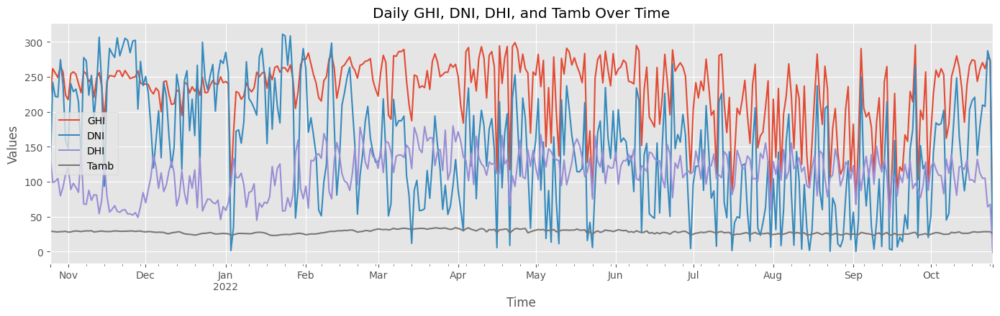

In [18]:
df.set_index('Timestamp', inplace=True)

# Resample the data by day or month to observe patterns (optional: you can resample by hour as well)
df_daily = df.resample('D').mean()
df_monthly = df.resample('M').mean()

# Plotting GHI, DNI, DHI, and Tamb over time (using daily resampled data)
plt.figure(figsize=(14, 8))

# Line plot for GHI, DNI, DHI, and Tamb
plt.subplot(2, 1, 1)
df_daily[['GHI', 'DNI', 'DHI', 'Tamb']].plot(ax=plt.gca(), linewidth=1.5)
plt.title('Daily GHI, DNI, DHI, and Tamb Over Time')
plt.ylabel('Values')
plt.xlabel('Time')
plt.grid(True)

plt.tight_layout()
plt.show()

Correlational analysis

Correlation Matrix:
                     GHI       DNI       DHI      ModA      ModB      Tamb  \
GHI            1.000000  0.867090  0.830339  0.992656  0.993298  0.563298   
DNI            0.867090  1.000000  0.549731  0.879232  0.878419  0.501879   
DHI            0.830339  0.549731  1.000000  0.813539  0.813334  0.484411   
ModA           0.992656  0.879232  0.813539  1.000000  0.998678  0.561525   
ModB           0.993298  0.878419  0.813334  0.998678  1.000000  0.556723   
Tamb           0.563298  0.501879  0.484411  0.561525  0.556723  1.000000   
RH            -0.259949 -0.319312 -0.151347 -0.287993 -0.281505 -0.400410   
WS             0.439021  0.370365  0.407059  0.436255  0.437453  0.216673   
WSgust         0.468454  0.394592  0.433683  0.465616  0.466635  0.246158   
WSstdev        0.418477  0.351366  0.386204  0.416253  0.416667  0.248468   
Cleaning            NaN       NaN       NaN       NaN       NaN       NaN   
WD             0.088558 -0.010807  0.153979  0.056635  

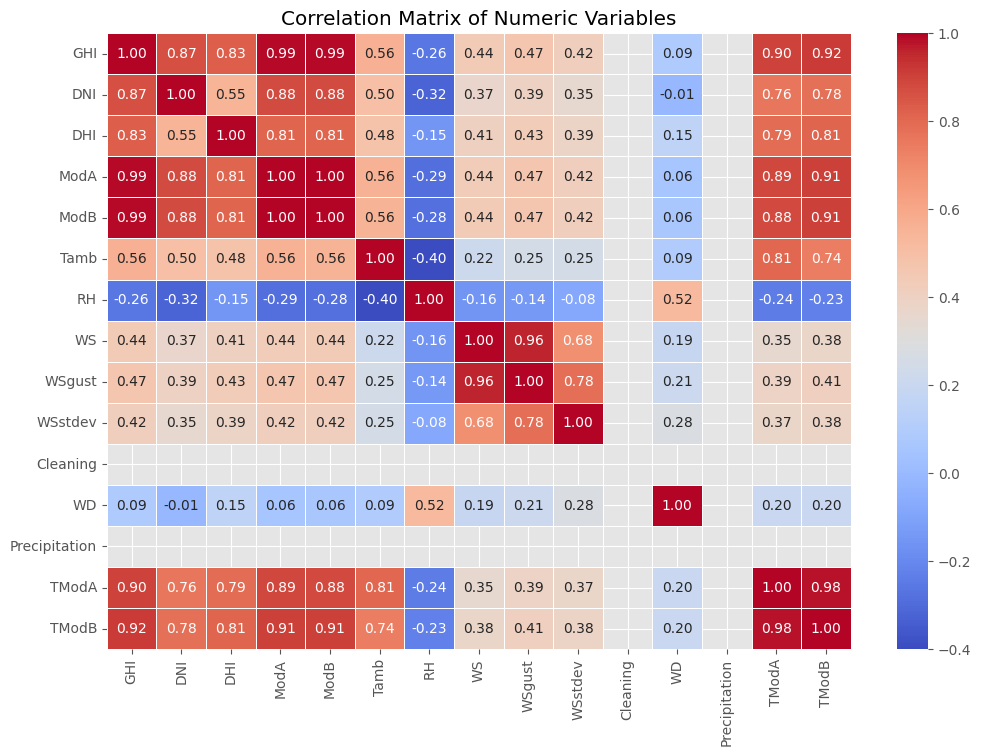

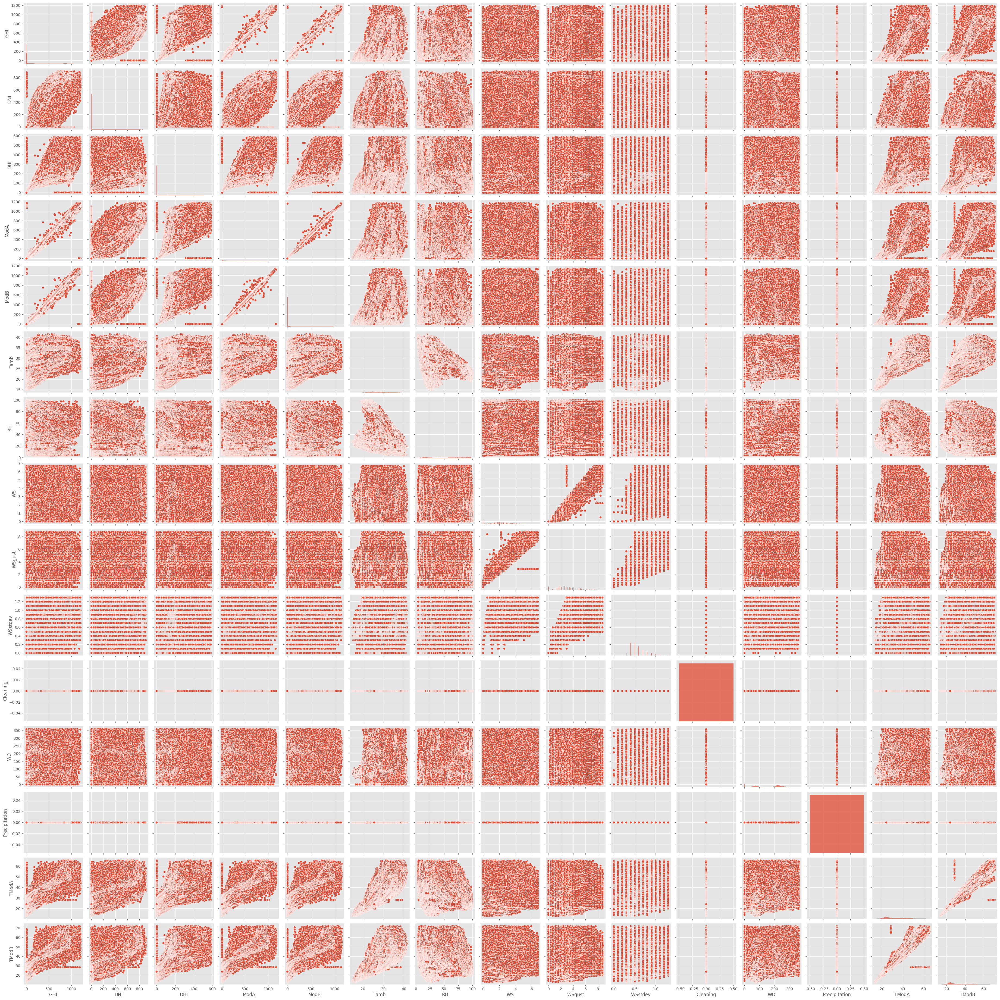

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure numeric columns are properly handled
benin_df_numeric = df.drop('Timestamp', axis=1, errors='ignore').apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix for numeric columns
correlation_matrix = benin_df_numeric.corr()

# Print the correlation matrix
print("Correlation Matrix:\n", correlation_matrix)

# Plotting the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Numeric Variables')
plt.show()

# Optional: Pairplot for further investigation of correlations
sns.pairplot(benin_df_numeric)
plt.show()


Wind Speed and  Direction 

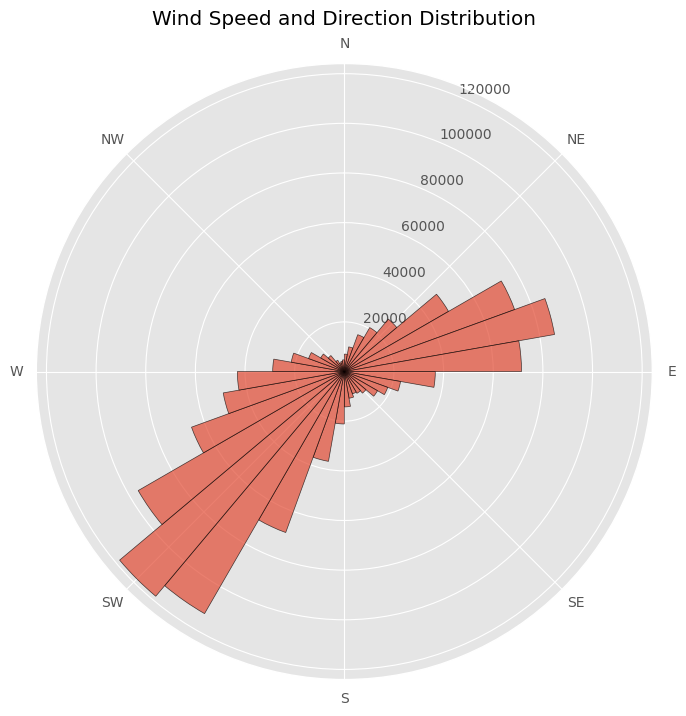

In [21]:

# Prepare the data
wind_speed = df['WS']   # Wind Speed
wind_direction = df['WD']  # Wind Direction in degrees

# Ensure no NaN values in the data for plotting
wind_speed = wind_speed.dropna()
wind_direction = wind_direction.dropna()

# Convert wind direction to radians for polar plotting
wind_direction_rad = np.deg2rad(wind_direction)

# Create a wind rose (polar plot)
plt.figure(figsize=(10, 8))
ax = plt.subplot(111, polar=True)

# Create a histogram for wind direction and speed
# Binning wind directions into 36 bins (10 degrees each)
num_bins = 36
bins = np.linspace(0, 2 * np.pi, num_bins + 1)
wind_speed_bins = ax.hist(wind_direction_rad, bins=bins, weights=wind_speed, alpha=0.7, edgecolor='k')

# Set labels and titles
ax.set_theta_direction(-1)  # Reverse direction to match meteorological conventions
ax.set_theta_offset(np.pi / 2.0)  # Rotate to set 0 degrees to north
ax.set_title("Wind Speed and Direction Distribution", va='bottom')
ax.set_xticks(np.linspace(0, 2 * np.pi, 8, endpoint=False))  # Set cardinal directions
ax.set_xticklabels(['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW'])

# Display the polar plot
plt.show()


Temprature Analysis

c:\Users\Ghost\Desktop\TenxWeek0\.venev\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


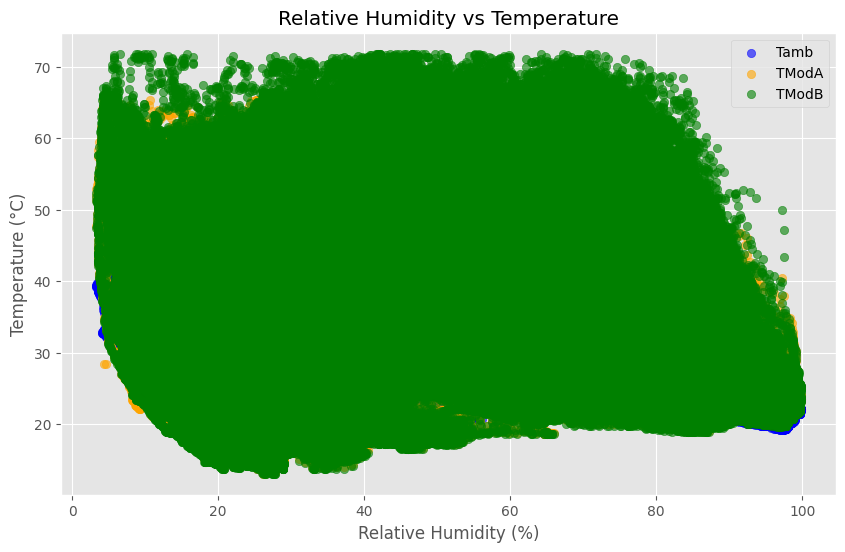

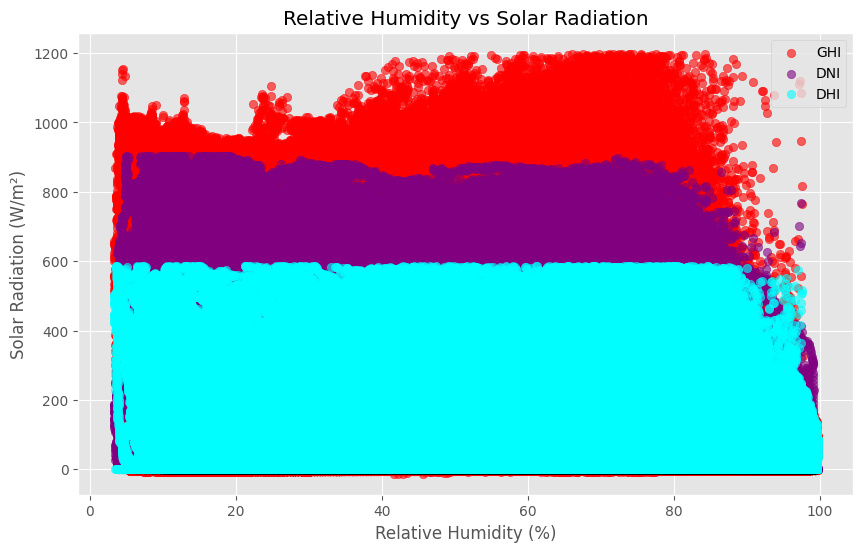

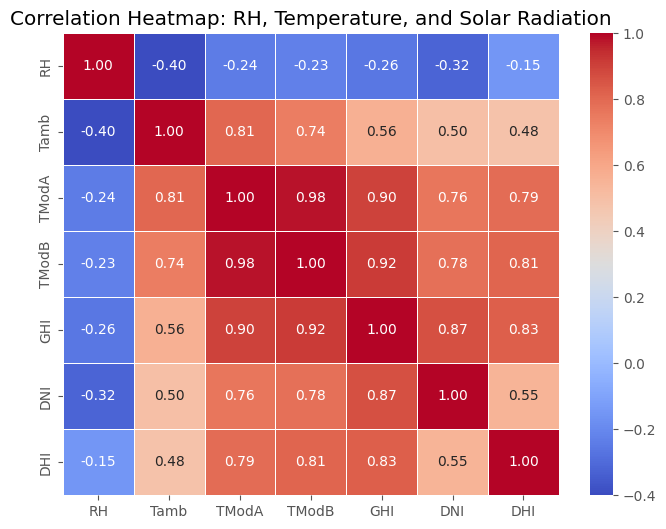

In [22]:

# Scatter Plot: RH vs. Temperature
plt.figure(figsize=(10, 6))
plt.scatter(df['RH'], df['Tamb'], alpha=0.6, color='blue', label='Tamb')
plt.scatter(df['RH'], df['TModA'], alpha=0.6, color='orange', label='TModA')
plt.scatter(df['RH'], df['TModB'], alpha=0.6, color='green', label='TModB')
plt.title("Relative Humidity vs Temperature")
plt.xlabel("Relative Humidity (%)")
plt.ylabel("Temperature (°C)")
plt.legend()
plt.grid(True)
plt.show()

# Scatter Plot: RH vs Solar Radiation (GHI, DNI, DHI)
plt.figure(figsize=(10, 6))
plt.scatter(df['RH'], df['GHI'], alpha=0.6, color='red', label='GHI')
plt.scatter(df['RH'], df['DNI'], alpha=0.6, color='purple', label='DNI')
plt.scatter(df['RH'], df['DHI'], alpha=0.6, color='cyan', label='DHI')
plt.title("Relative Humidity vs Solar Radiation")
plt.xlabel("Relative Humidity (%)")
plt.ylabel("Solar Radiation (W/m²)")
plt.legend()
plt.grid(True)
plt.show()

# Heatmap: Correlation Analysis
# Calculate correlation matrix for selected columns
correlation_matrix = df[['RH', 'Tamb', 'TModA', 'TModB', 'GHI', 'DNI', 'DHI']].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap: RH, Temperature, and Solar Radiation")
plt.show()


Histogram for distrubtion 

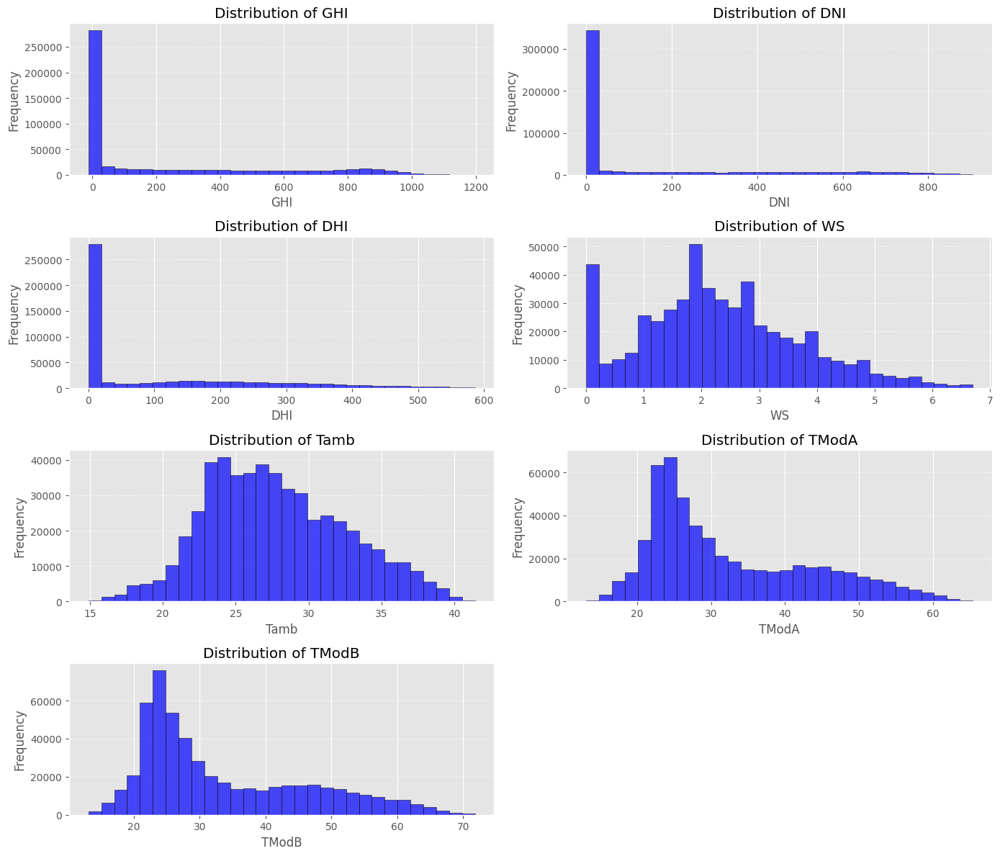

In [23]:
# Define columns to plot 
columns_to_plot = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb', 'TModA', 'TModB']

# Create a figure for histograms 
plt.figure(figsize=(14, 12))

# Loop through each column and plot a histogram
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(4, 2, i)  # Create a subplot grid (4 rows, 2 columns)
    plt.hist(df[column], bins=30, color='blue', alpha=0.7, edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(axis='y', linestyle='--', alpha=0.6)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

Bubble charts

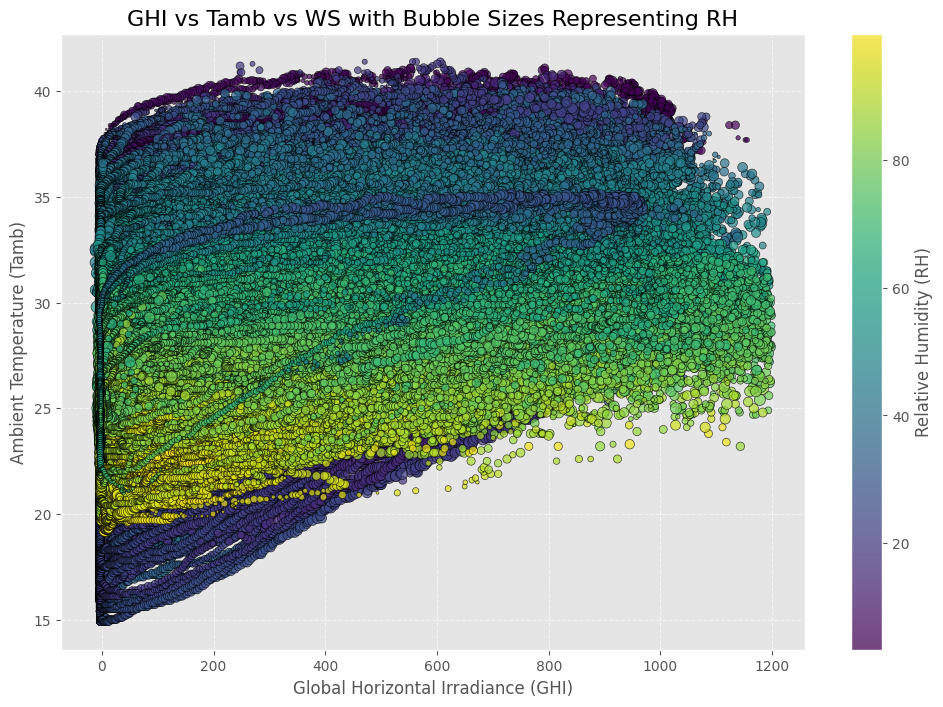

In [24]:

# Define the variables to plot
x = df['GHI']     # X-axis: Global Horizontal Irradiance
y = df['Tamb']    # Y-axis: Ambient Temperature
bubble_size = df['WS']  # Bubble size: Wind Speed
color = df['RH']  # Bubble color: Relative Humidity (RH)

# Plot the bubble chart
plt.figure(figsize=(12, 8))
bubble = plt.scatter(
    x, y, 
    s=bubble_size * 10,  # Scale bubble size for better visibility
    c=color,             # Use RH or BP for color mapping
    cmap='viridis',      # Color map for RH
    alpha=0.7,           # Transparency
    edgecolor='black'    # Bubble edges
)

# Add color bar for reference
color_bar = plt.colorbar(bubble)
color_bar.set_label('Relative Humidity (RH)', fontsize=12)

# Add labels and title
plt.title('GHI vs Tamb vs WS with Bubble Sizes Representing RH', fontsize=16)
plt.xlabel('Global Horizontal Irradiance (GHI)', fontsize=12)
plt.ylabel('Ambient Temperature (Tamb)', fontsize=12)

# Add grid
plt.grid(True, linestyle='--', alpha=0.6)

# Display the plot
plt.show()
